In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# from tensorflow.compat.v1 import ConfigProto
# from tensorflow.compat.v1 import InteractiveSession

# config = ConfigProto()
# config.gpu_options.allow_growth = True
# session = InteractiveSession(config=config)

# Environment prep for Colab
 - download git repo 
 - install required pip packages

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')
#!mkdir /content/drive/My\ Drive/Results
#MAIN_SAVE_DIR = '/content/drive/My Drive/Results'
#IMG_DIR = '/content/Generative_Models/data/.pokemon' #change .qbert here as well!git clone https://github.com/kkahloots/Generative_Models.git # this is for loading git with correct brach
#%cd /content/Generative_Models/
#!pip -q install -r /content/Generative_Models/requirements.txt
#!pip install colorlog==4.0.2
#%cd /content/

# Connect Drive to save and restore results

In [4]:
#from google.colab import drive
#drive.mount('/content/drive')
#!mkdir /content/drive/My\ Drive/Results
#MAIN_SAVE_DIR = '/content/drive/My Drive/Results'
#IMG_DIR = '/content/Generative_Models/data/.pokemon' #change .qbert here as well

# Settings

In [5]:
%env TF_KERAS = 1
import os
sep_local = os.path.sep

import sys
#sys.path.append('..'+sep_local+'..')
print(sep_local)

env: TF_KERAS=1
\


In [6]:
#!pip -q install -r requirements.txt

In [7]:
import tensorflow as tf
print(tf.__version__)

2.3.1


In [8]:
os.getcwd()

'C:\\Users\\Kriple\\PycharmProjects\\pythonProject\\Rethinking_Data_Effeient_GANs\\notebooks\\Pokemon'

In [9]:
os.chdir('..'+sep_local+'..'+sep_local)
print(os.getcwd())

C:\Users\Kriple\PycharmProjects\pythonProject\Rethinking_Data_Effeient_GANs


# only on colab

In [10]:
#!cat data/.pokemon/pokemon.tar.part* > data/.pokemon/pokemon.tar

In [11]:
#!tar -xvf data/.pokemon/pokemon_combined.tar --directory data/.pokemon/

# Dataset loading

In [12]:
from generators.from_lmdb.lmdb_image_generator import get_generators

In [13]:
dataset_name='pokemon'
inputs_shape= image_shape=(128, 128, 3)
batch_size = 36
latents_dim = 256
intermediate_dim = 50
lmdb_dir = 'data/.pokemon_LMDB'

In [14]:
from transformation.lmdb_transformer import LmdbTransformer

In [15]:
train_generator, val_generator = get_generators(
        lmdb_dir=lmdb_dir,
        batch_size=batch_size,
        episode_len=None,
        episode_shift=None,
        return_itr=False
)

C:\Users\Kriple\PycharmProjects\pythonProject\Rethinking_Data_Effeient_GANs\transformation\file_image_generator.py:51: UserWarning: No files found
  warnings.warn(msg)


Initializing Iterator training Number of images 591
Initializing Iterator validation Number of images 218


In [16]:
for batch in val_generator:
    break

In [17]:
from utils.utils import img_merge

C:\Users\Kriple\PycharmProjects\pythonProject\Rethinking_Data_Effeient_GANs\utils\utils.py:33: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [18]:
image_grid = img_merge(batch['images'], n_rows=6).squeeze()

In [19]:
from PIL import Image
import numpy as np

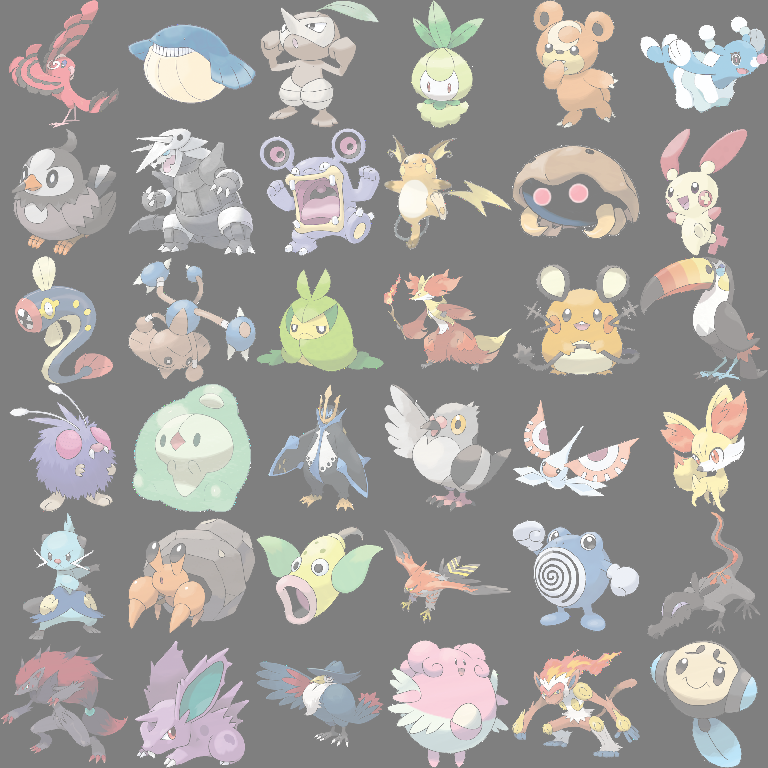

In [20]:
Image.fromarray(image_grid.astype(np.uint8))

In [364]:
import random
from augmentation.DiffAugmentPlus import DiffAugmentPlus, rand_cutout

In [365]:
image = batch['images'][2]

In [366]:
image.shape[:2]

TensorShape([128, 128])

In [367]:
im_list_2d = [DiffAugmentPlus(tf.expand_dims(image, 0), level=1)[0] for _ in range(2)]

<function clone at 0x0000028072DFA8B0>
<function rand_skew at 0x0000028072DFA790>


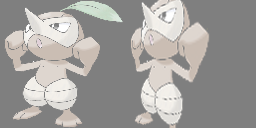

In [368]:
Image.fromarray(img_merge(im_list_2d).squeeze().astype(np.uint8))

In [369]:
from PIL import Image
im = Image.fromarray((im_list_2d[0].numpy()* 255).astype(np.uint8))

In [370]:
start = [im.size[0]//random.randint(1, 5), im.size[0]//random.randint(1, 5)]

In [371]:
start = [im.size[0]//random.randint(1, 5), im.size[0]//random.randint(1, 5)]
e1 = im.size[0]//random.randint(1, 5)
e2 = im.size[0]//random.randint(1, 5)
end = [min(start[0]+e1,im.size[0]) , min(start[1]+e1,im.size[0])]


In [372]:
end = [min(start[0]+e1,im.size[0]) , min(start[1]+e1,im.size[0])]

In [373]:
region = im.crop([*start, *end])

In [374]:
im2 = Image.fromarray((im_list_2d[1].numpy()* 255).astype(np.uint8))

In [375]:
start2 = [im.size[0]//random.randint(1, 5), im.size[0]//random.randint(1, 5)]
end2 = [min(start2[0]+e1,im.size[0]) , min(start2[1]+e1,im.size[0])]

In [376]:
im2.paste(region, [*start, *end])

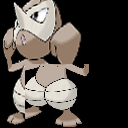

In [377]:
im2

In [ ]:

im.save("pasted.grid.png")

In [ ]:
batch_size = tf.shape(x)[0]
image_size = tf.shape(x)[1:3]
cutout_size = tf.cast(tf.cast(image_size, tf.float32) * ratio + 0.5, tf.int32)
offset_x = tf.random.uniform([tf.shape(x)[0], 1, 1], maxval=image_size[0] + (1 - cutout_size[0] % 2),
                             dtype=tf.int32)
offset_y = tf.random.uniform([tf.shape(x)[0], 1, 1], maxval=image_size[1] + (1 - cutout_size[1] % 2),
                             dtype=tf.int32)
grid_batch, grid_x, grid_y = tf.meshgrid(tf.range(batch_size, dtype=tf.int32),
                                         tf.range(cutout_size[0], dtype=tf.int32),
                                         tf.range(cutout_size[1], dtype=tf.int32), indexing='ij')
cutout_grid = tf.stack(
    [grid_batch, grid_x + offset_x - cutout_size[0] // 2, grid_y + offset_y - cutout_size[1] // 2], axis=-1)
mask_shape = tf.stack([batch_size, image_size[0], image_size[1]])
cutout_grid = tf.maximum(cutout_grid, 0)
cutout_grid = tf.minimum(cutout_grid, tf.reshape(mask_shape - 1, [1, 1, 1, 3]))
mask = tf.maximum(
    1 - tf.scatter_nd(cutout_grid, tf.ones([batch_size, cutout_size[0], cutout_size[1]], dtype=tf.float32),
                      mask_shape), 0)
x = x * tf.expand_dims(mask, axis=3)

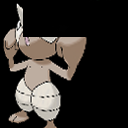

In [212]:
Image.fromarray((im_list_2d[0]+im_list_2d[1] * 255).numpy().astype(np.uint8))

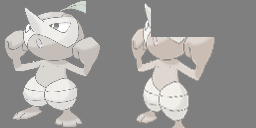

In [213]:
Image.fromarray(img_merge(im_list_2d).squeeze().astype(np.uint8))

In [135]:
import cv2

In [151]:
def concat_tile(im_list_2d):
    return cv2.vconcat([cv2.hconcat(im_list_h) for im_list_h in im_list_2d])


In [152]:
image.shape[:2]

TensorShape([128, 128])

In [153]:
im_tile = concat_tile(im_list_2d)

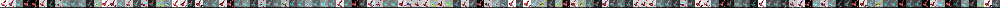

In [154]:
Image.fromarray((im_tile*255).astype(np.uint8))

In [144]:
from augmentation.DiffAugmentPlus import DiffAugmentPlus

level 1
<function rand_zoom at 0x00000191E5271160>


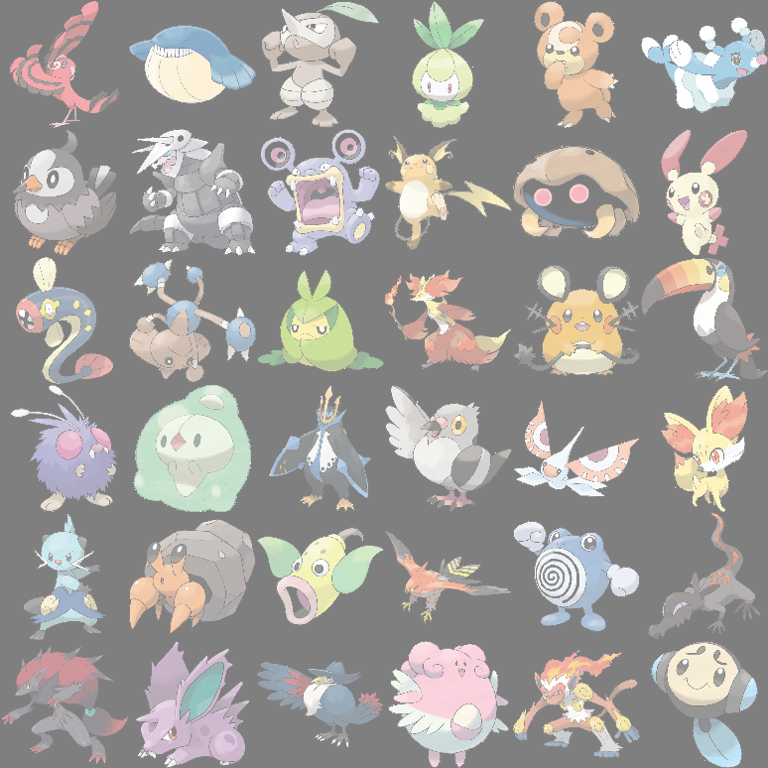

<function clone at 0x00000191E51F9310>


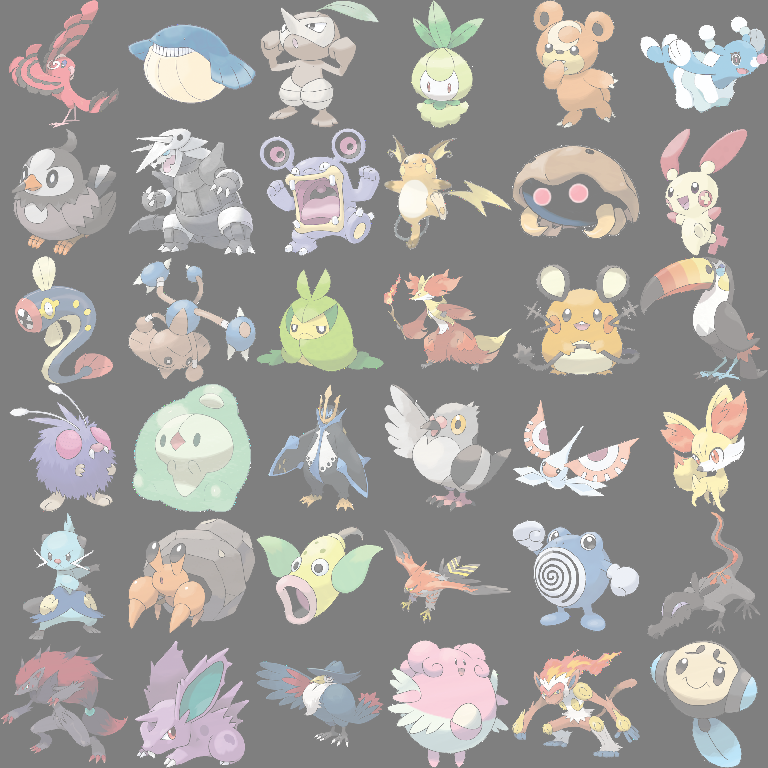

<function clone at 0x00000191E51F9310>


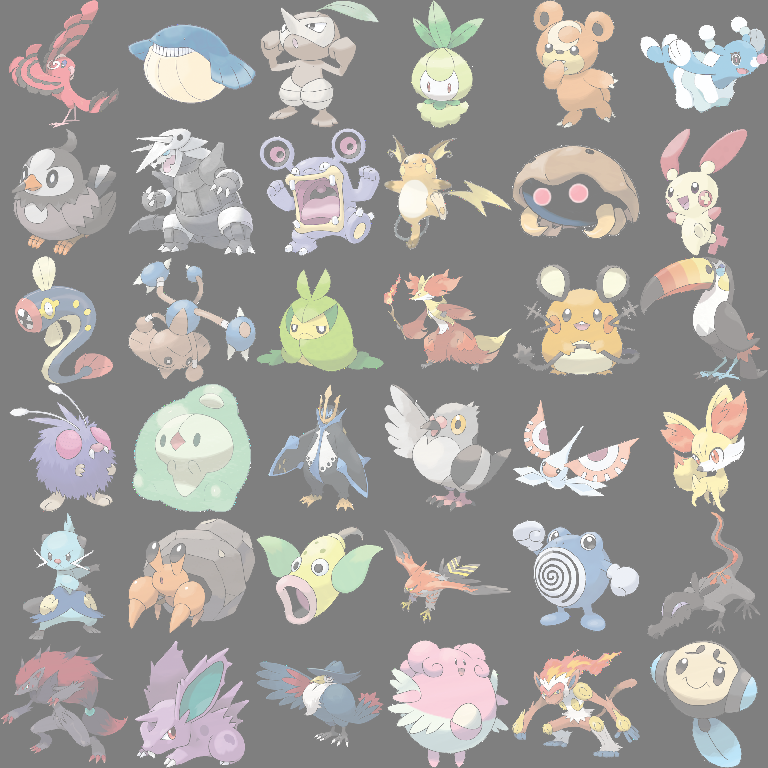

<function rand_brightness at 0x00000191E5259940>


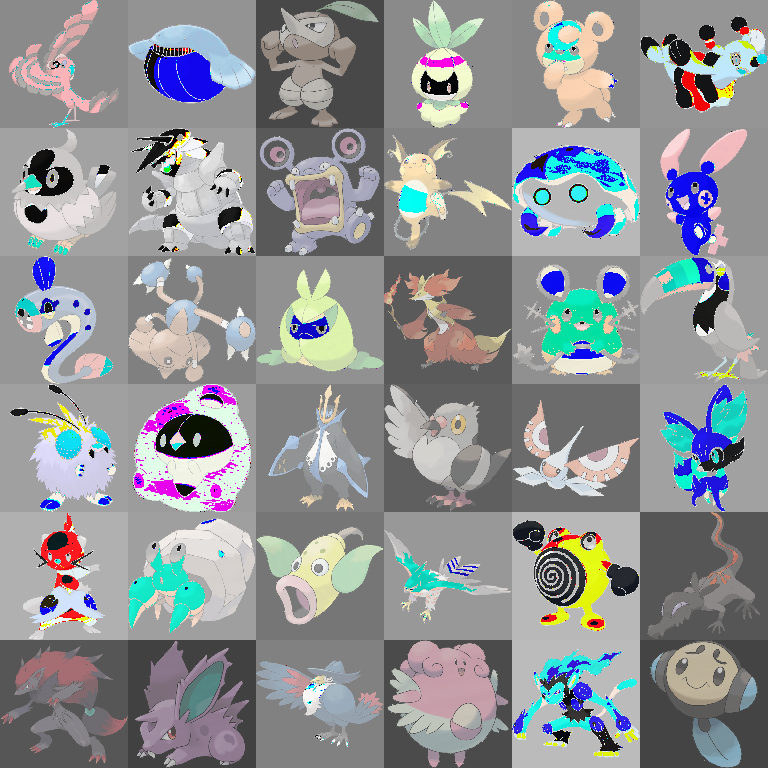

<function rand_flip at 0x00000191E51F9D30>


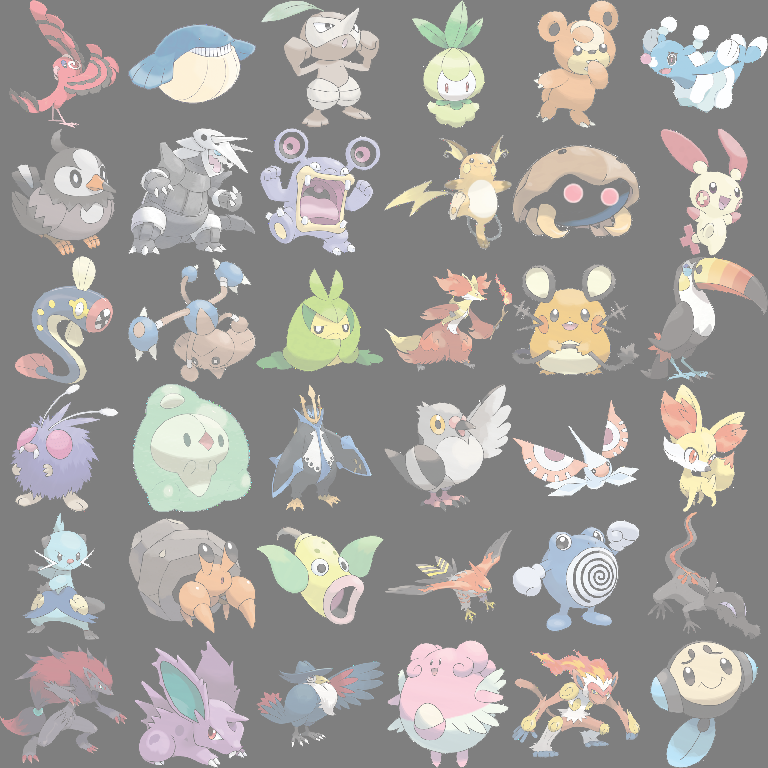

level 2
<function clone at 0x00000191E51F9310>
<function clone at 0x00000191E51F9310>


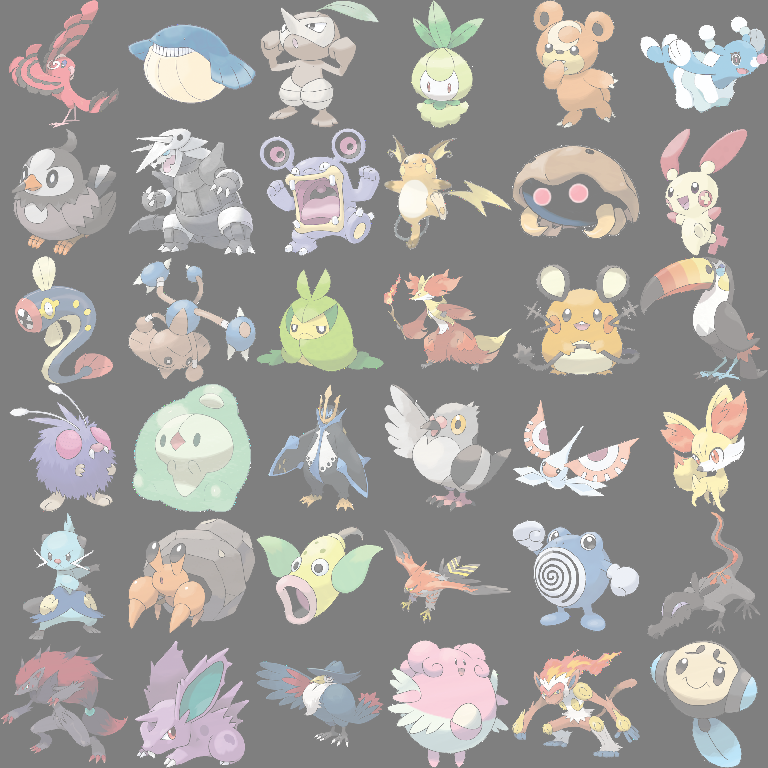

<function rand_saturation at 0x00000191E52599D0>
<function rand_zoom at 0x00000191E5271160>


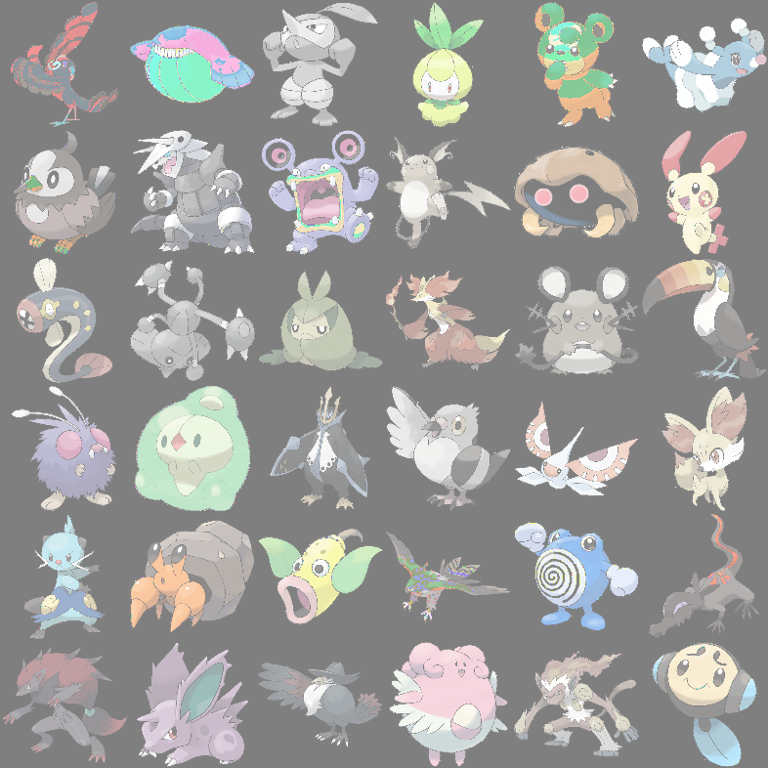

<function rand_contrast at 0x00000191D2FE30D0>
<function rand_contrast at 0x00000191D2FE30D0>


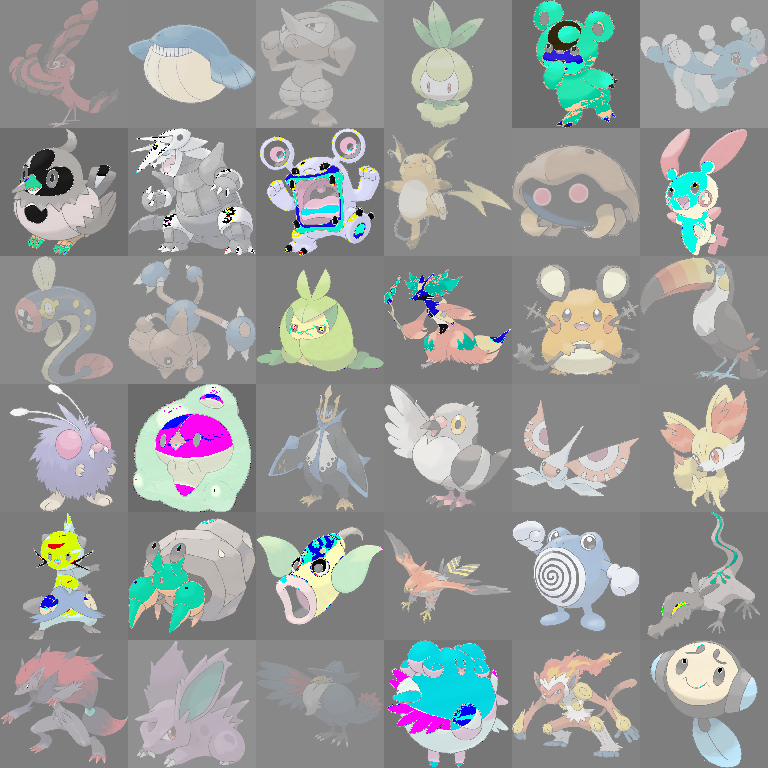

<function rand_shear at 0x00000191E51F94C0>
<function rand_brightness at 0x00000191E5259940>


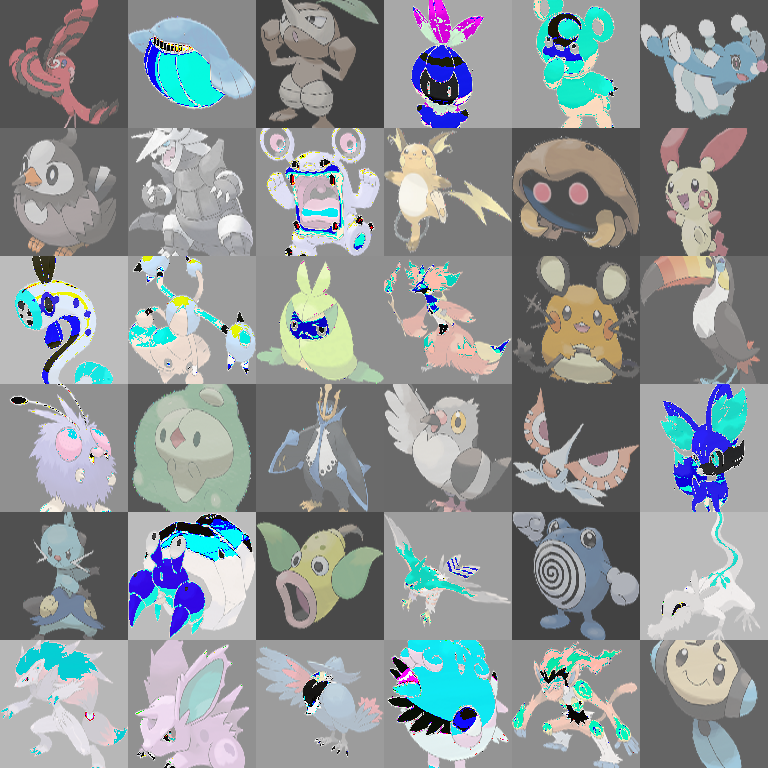

<function rand_contrast at 0x00000191D2FE30D0>
<function clone at 0x00000191E51F9310>


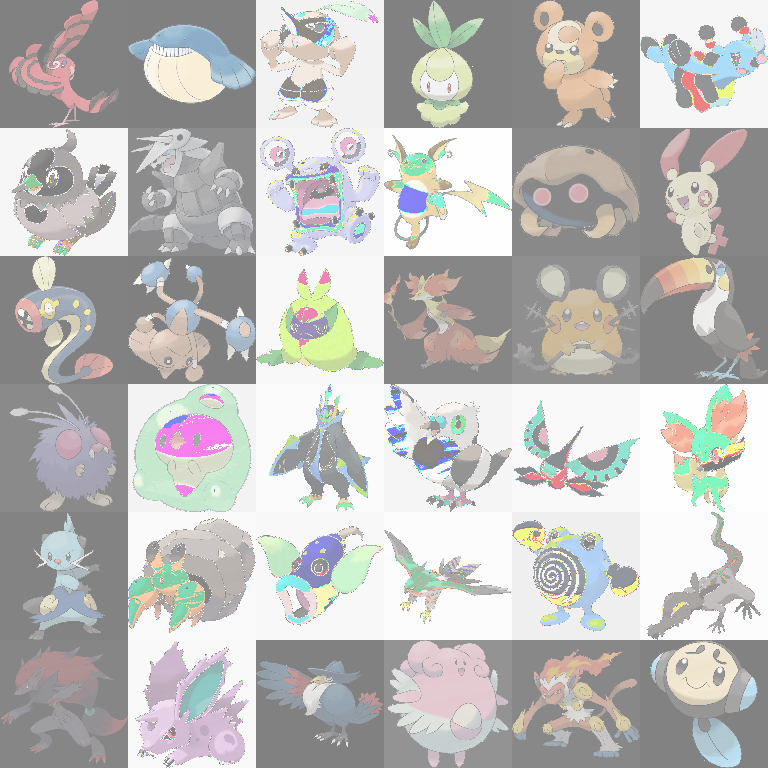

level 3
<function rand_contrast at 0x00000191D2FE30D0>
<function rand_flip at 0x00000191E51F9D30>
<function rand_shear at 0x00000191E51F94C0>


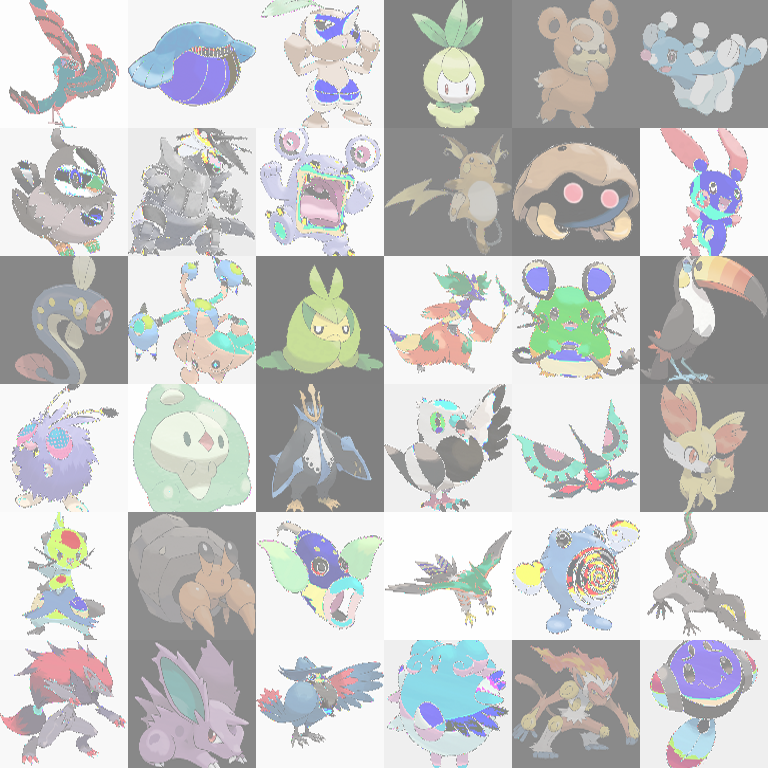

<function rand_rotate at 0x00000191E52714C0>
<function rand_shear at 0x00000191E51F94C0>
<function rand_contrast at 0x00000191D2FE30D0>


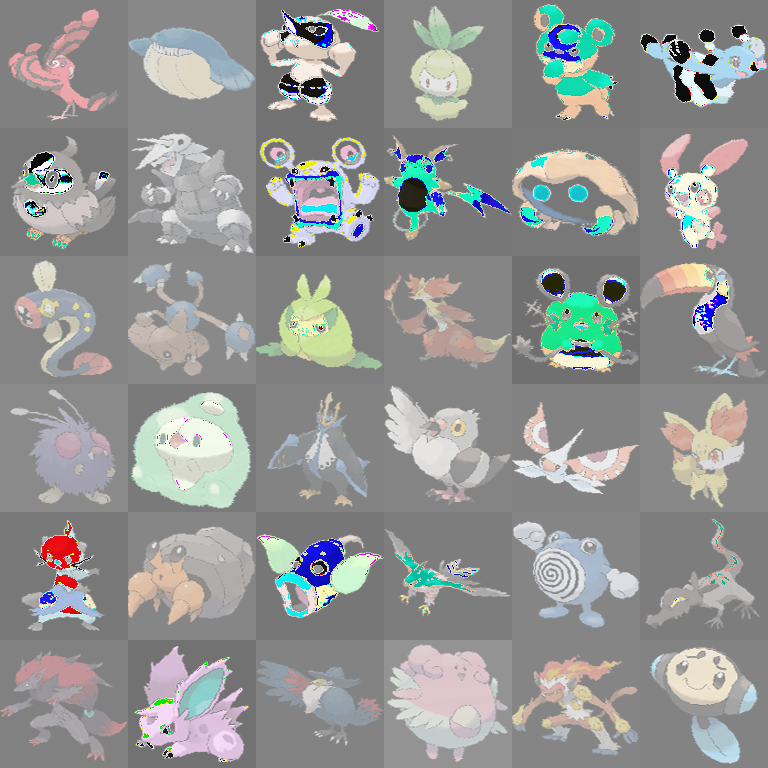

<function rand_colorize at 0x00000191E51F91F0>
<function clone at 0x00000191E51F9310>
<function rand_brightness at 0x00000191E5259940>


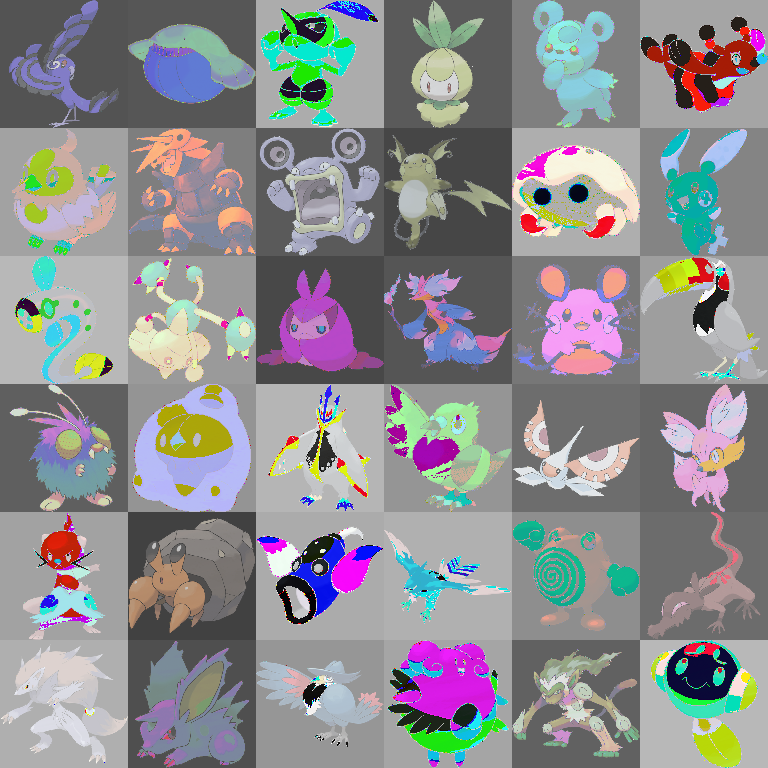

<function clone at 0x00000191E51F9310>
<function rand_shear at 0x00000191E51F94C0>
<function rand_zoom at 0x00000191E5271160>


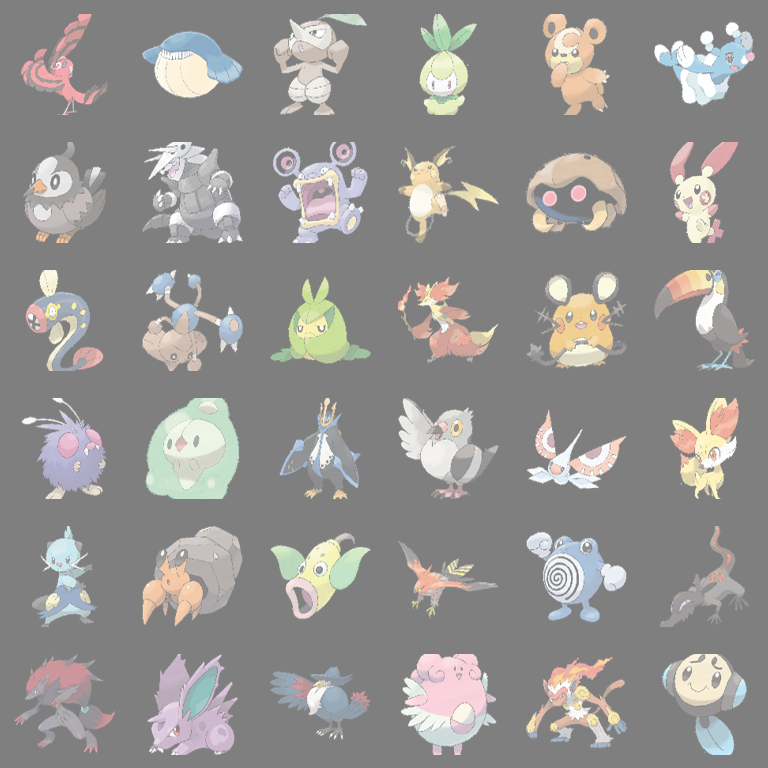

<function rand_rotate at 0x00000191E52714C0>
<function rand_contrast at 0x00000191D2FE30D0>
<function rand_distort at 0x00000191E51F9670>


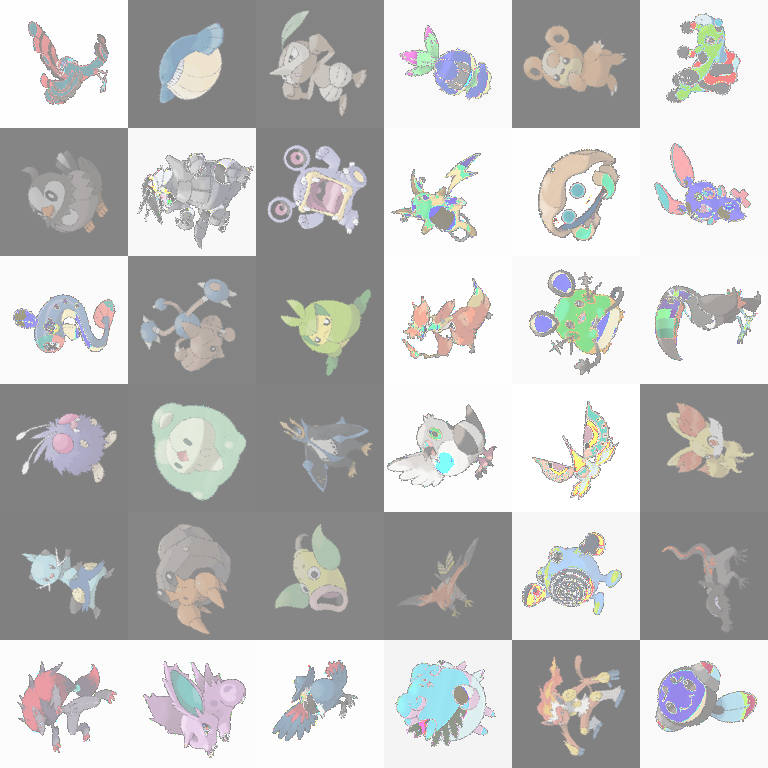

level 4
<function clone at 0x00000191E51F9310>
<function clone at 0x00000191E51F9310>
<function rand_contrast at 0x00000191D2FE30D0>
<function clone at 0x00000191E51F9310>


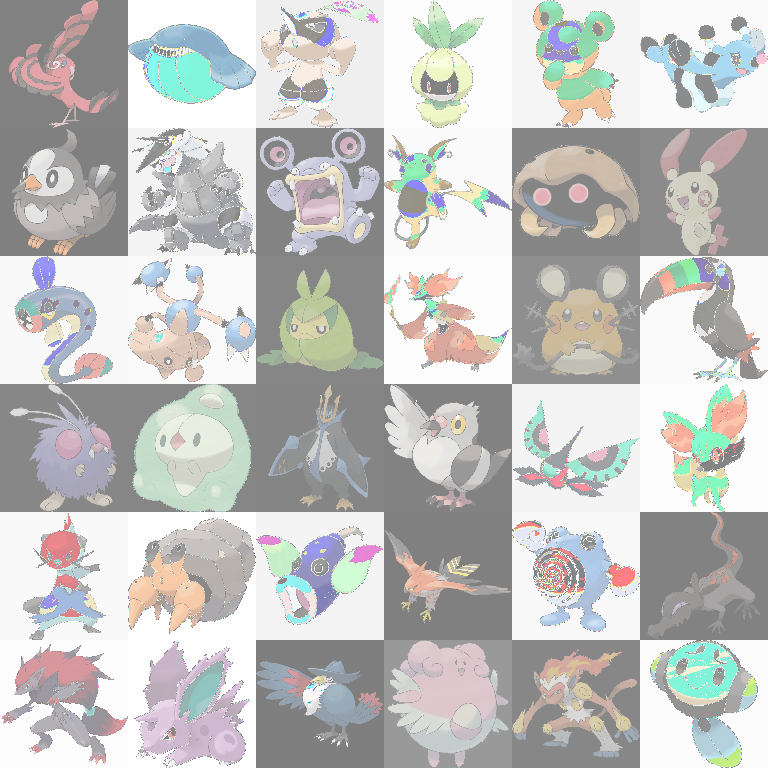

<function rand_shear at 0x00000191E51F94C0>
<function rand_saturation at 0x00000191E52599D0>
<function rand_distort at 0x00000191E51F9670>
<function rand_skew at 0x00000191E51F9A60>


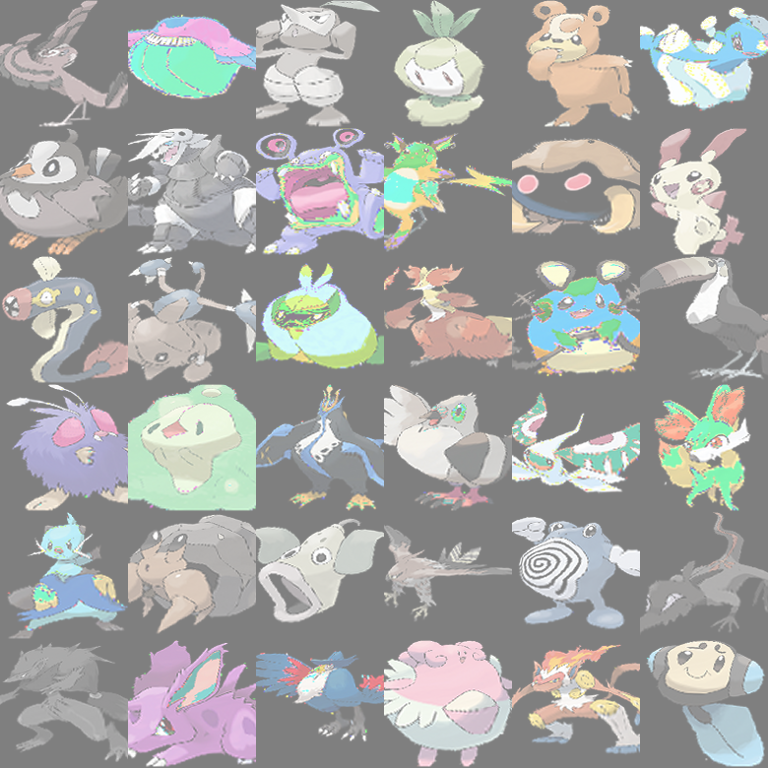

<function rand_distort at 0x00000191E51F9670>
<function rand_zoom at 0x00000191E5271160>
<function rand_rotate at 0x00000191E52714C0>
<function clone at 0x00000191E51F9310>


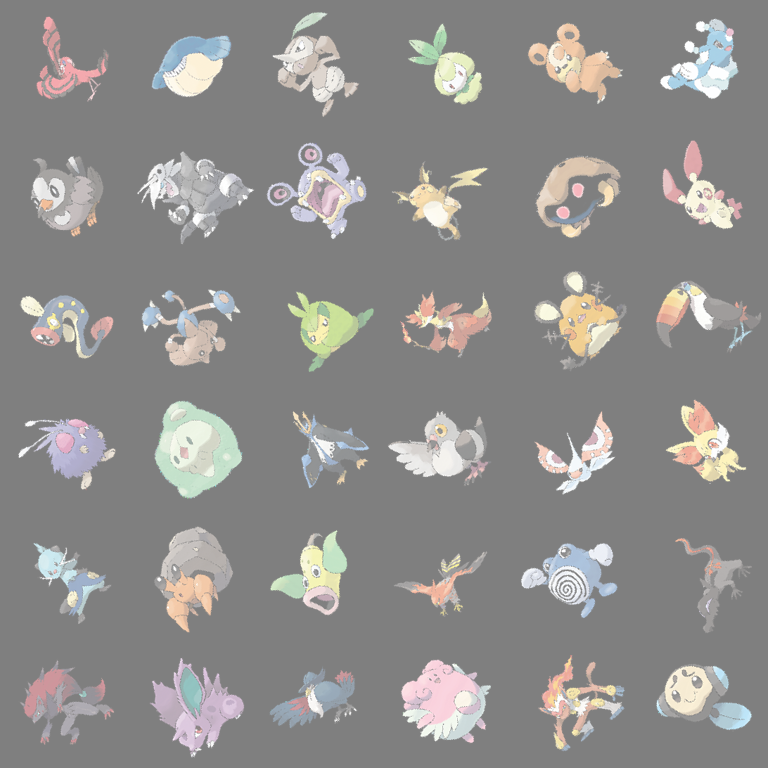

<function clone at 0x00000191E51F9310>
<function rand_saturation at 0x00000191E52599D0>
<function rand_shear at 0x00000191E51F94C0>
<function rand_flip at 0x00000191E51F9D30>


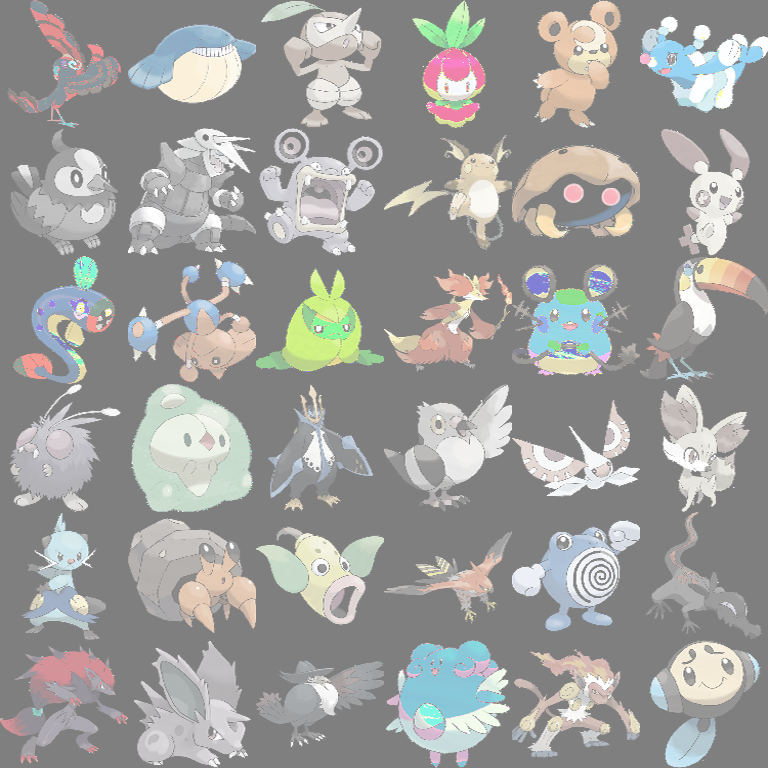

<function rand_contrast at 0x00000191D2FE30D0>
<function rand_shear at 0x00000191E51F94C0>
<function rand_contrast at 0x00000191D2FE30D0>
<function rand_distort at 0x00000191E51F9670>


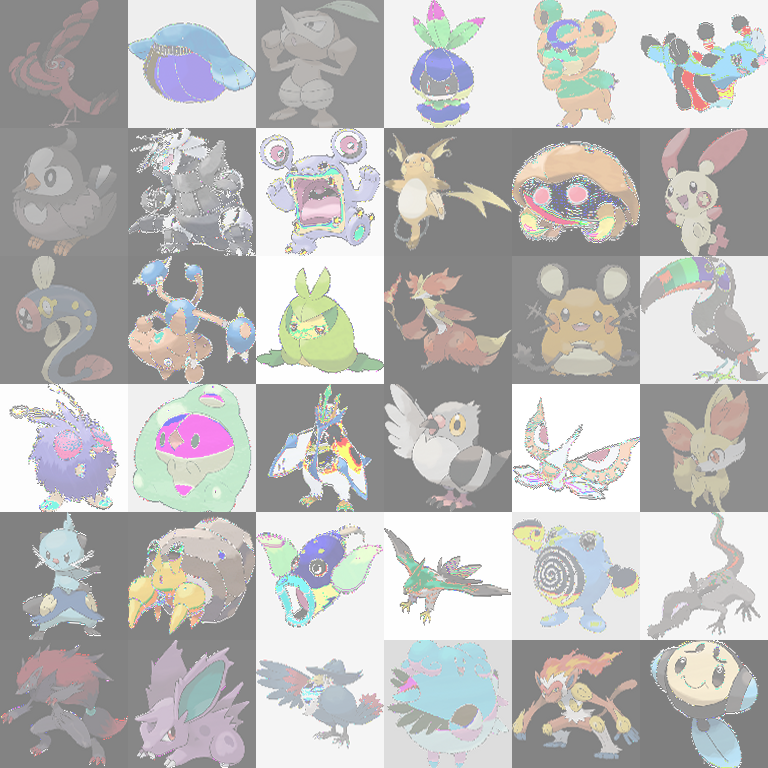

In [177]:
print('level 1')
for _ in range(5):
    aug_batch = DiffAugmentPlus(batch['images'], level=1)
    image_grid = img_merge(aug_batch, n_rows=6).squeeze()
    display(Image.fromarray(image_grid.astype(np.uint8)))

print('level 2')
for _ in range(5):
    aug_batch = DiffAugmentPlus(batch['images'], level=2)
    image_grid = img_merge(aug_batch, n_rows=6).squeeze()
    display(Image.fromarray(image_grid.astype(np.uint8)))

print('level 3')    
for _ in range(5):
    aug_batch = DiffAugmentPlus(batch['images'], level=3)
    image_grid = img_merge(aug_batch, n_rows=6).squeeze()
    display(Image.fromarray(image_grid.astype(np.uint8)))

print('level 4')     
for _ in range(5):
    aug_batch = DiffAugmentPlus(batch['images'], level=4)
    image_grid = img_merge(aug_batch, n_rows=6).squeeze()
    display(Image.fromarray(image_grid.astype(np.uint8)))    

In [23]:
import numpy as np
_instance_scale=1.0
for data in val_generator:
    print(np.max(data['images']))
    break
    #print(data.keys())

1.0


In [24]:
[*data['images'][0].shape]

[128, 128, 3]

In [25]:
data.keys()

dict_keys(['images', 'label'])

# Callbacks definition

In [26]:
restore_path = './saved_models/AUG_PLUS_WGAN_GP'

# Model definition

In [27]:
from building.AugPlus_WGAN_GP import AugmentPlus_WGAN_GP as AUG_PLUS_GAN

In [28]:
done = False

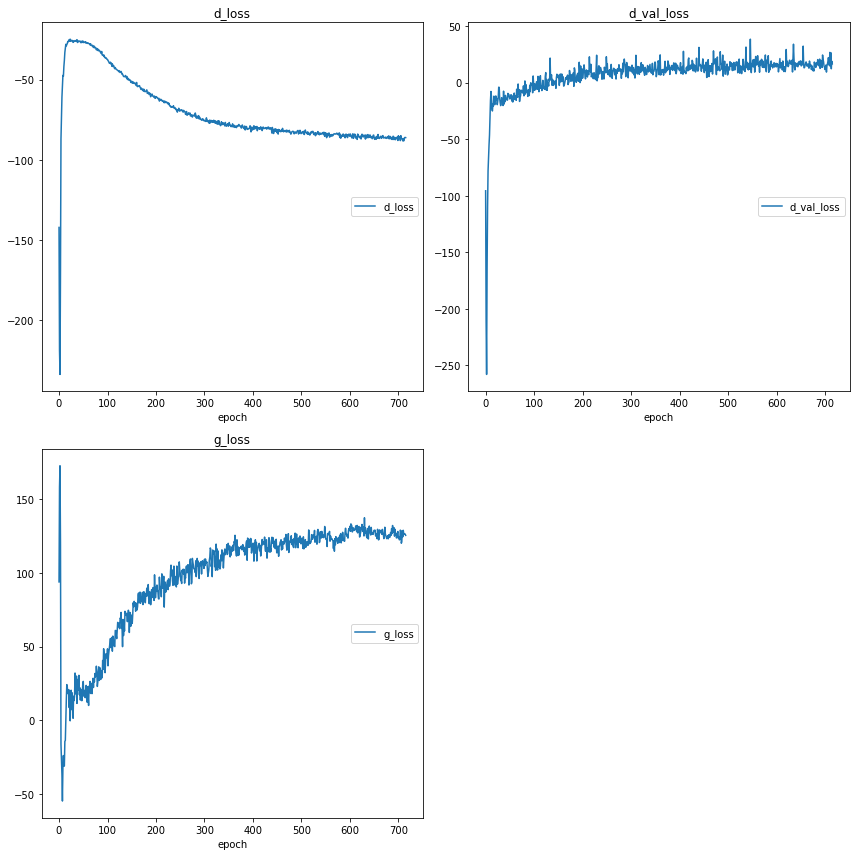

d_loss
	d_loss           	 (min: -234.054, max:  -24.739, cur:  -86.188)
d_val_loss
	d_val_loss       	 (min: -257.931, max:   38.490, cur:   16.742)
g_loss
	g_loss           	 (min:  -54.676, max:  172.712, cur:  125.529)
Epoch 717/50000


In [ ]:

while not done:
    try:
        gan_model = AUG_PLUS_GAN(
                    model_name=dataset_name+'_AUG_PLUS_GAN', 
                    save_path=restore_path, 
                    image_size=inputs_shape, 
                    z_dim=latents_dim, 
                    n_critic=5, 
                    batch_size=batch_size,
                    g_penalty=10
                   )
        done = gan_model.train(dataset=train_generator, val_dataset=val_generator, epochs=int(5e4), n_itr=300)
    except:
        pass

In [ ]:
xxx

In [ ]:
#to restore trained model, set filepath=_restore

In [ ]:
ae = AE( 
    name=model_name,
    latents_dim=latents_dim,
    batch_size=batch_size,
    variables_params=variables_params, 
    filepath=_restore
    )

In [ ]:
ae.compile(metrics=None)

In [ ]:
ae.output_shape

# Callbacks

In [ ]:
from training.callbacks.sample_generation import SampleGeneration
from training.callbacks.save_model import ModelSaver

In [ ]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', 
    min_delta=1e-15, 
    patience=10, 
    verbose=1, 
    restore_best_weights=False
)

In [ ]:
ms = ModelSaver(filepath=_restore)

In [ ]:
csv_dir = os.path.join(experiments_dir, 'csv_dir')
create_if_not_exist(csv_dir)
csv_dir = os.path.join(csv_dir, ae.name+'.csv')
csv_log = tf.keras.callbacks.CSVLogger(csv_dir, append=True)
csv_dir

In [ ]:
image_gen_dir = os.path.join(experiments_dir, 'image_gen_dir')
create_if_not_exist(image_gen_dir)

In [ ]:
sg = SampleGeneration(latents_shape=latents_dim, filepath=image_gen_dir, gen_freq=5, save_img=True, gray_plot=False)

# Model Training

In [ ]:
ae.fit(
    x=train_generator,
    input_kw='images',
    steps_per_epoch=5,#int(5e3),
    epochs=5,#int(1e6), 
    verbose=1,
    #callbacks=[es, ms, csv_log, sg],
    workers=-1,
    use_multiprocessing=True,
    validation_data=train_generator,
    validation_steps=int(1e4)
)

# Model Evaluation

## inception_score

In [ ]:
from evaluation.generativity_metrics.inception_metrics import inception_score

In [ ]:
is_mean, is_sigma = inception_score(ae, tolerance_threshold=1e-6, max_iteration=1000)
print(f'inception_score mean: {is_mean.compute()}, sigma: {is_sigma.compute()}')

## Frechet_inception_distance

In [ ]:
from evaluation.generativity_metrics.inception_metrics import frechet_inception_distance

In [ ]:
fis_score = frechet_inception_distance(ae, train_generator.as_numpy_iterator(), 
                                       tolerance_threshold=1e-6, 
                                       max_iteration=1000, 
                                       batch_size=32)
print(f'frechet inception distance: {fis_score.compute()}')

## perceptual_path_length_score

In [ ]:
from evaluation.generativity_metrics.perceptual_path_length import perceptual_path_length_score

In [ ]:
ppl_mean_score = perceptual_path_length_score(ae, train_generator.as_numpy_iterator(), 
                                              tolerance_threshold=1e-6, 
                                              max_iteration=1000, 
                                              batch_size=32)
print(f'perceptual path length score: {ppl_mean_score}')

## precision score

In [ ]:
from evaluation.generativity_metrics.precision_recall import precision_score

In [ ]:
_precision_score = precision_score(ae,  train_generator.as_numpy_iterator(), 
                                   tolerance_threshold=1e-6, 
                                   max_iteration=1000)
print(f'precision score: {_precision_score}')

## recall score

In [ ]:
from evaluation.generativity_metrics.precision_recall import recall_score

In [ ]:
_recall_score = recall_score(ae, train_generator.as_numpy_iterator(), tolerance_threshold=1e-6, max_iteration=1000)
print(f'recall score: {_recall_score}')

# Image Generation

## image reconstruction

### Training dataset

In [ ]:
from training.generators.from_images.image_generation_testing import reconstruct_from_a_batch

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'reconstruct_training_images_like_a_batch_dir')
create_if_not_exist(save_dir)

reconstruct_from_a_batch(ae, train_generator.as_numpy_iterator(), save_dir)

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'reconstruct_testing_images_like_a_batch_dir')
create_if_not_exist(save_dir)

reconstruct_from_a_batch(ae, val_generator.as_numpy_iterator(), save_dir)

## with Randomness

In [ ]:
from training.generators.from_images.image_generation_testing import generate_images_like_a_batch

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'generate_training_images_like_a_batch_dir')
create_if_not_exist(save_dir)

generate_images_like_a_batch(ae, train_generator.as_numpy_iterator(), save_dir)

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'generate_testing_images_like_a_batch_dir')
create_if_not_exist(save_dir)

generate_images_like_a_batch(ae, val_generator.as_numpy_iterator(), save_dir)

### Complete Randomness

In [ ]:
from training.generators.from_images.image_generation_testing import generate_images_randomly

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'random_synthetic_dir')
create_if_not_exist(save_dir)

generate_images_randomly(ae, save_dir)

In [ ]:
from training.generators.from_images.image_generation_testing import interpolate_a_batch

In [ ]:
from utils.data_and_files.file_utils import create_if_not_exist
save_dir = os.path.join(experiments_dir, 'interpolate_dir')
create_if_not_exist(save_dir)

interpolate_a_batch(ae, val_generator.as_numpy_iterator(), save_dir)